#Rough Set

In [1]:
#Impor Library Rough Set
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import seaborn as sns
%matplotlib inline
import warnings

warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("kualitasair.csv",sep=';')
df

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,0.000,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,0.650,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,0.003,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,0.710,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,0.001,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,0.000,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
396,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,0.000,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
397,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,0.000,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
398,0.01,10.00,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,0.000,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


In [3]:
df=df.iloc[::,1:]         
#df=df.iloc[::,:-1] #memisahkan antara variabel x dan y
df

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,0.000,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,0.650,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,0.003,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,0.710,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,0.001,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,0.000,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
396,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,0.000,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
397,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,0.000,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
398,10.00,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,0.000,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


In [4]:
#melakukan encoding (mengganti kategori menjadi angka)
#df['Class'].value_counts()

In [5]:
#Encoding dengan data sedikit
#cleanup_nums = {"Class":     {"jasmine": 1, "Gonen": 2}}
#df = df.replace(cleanup_nums)
#df.head()

#Core and Reduct

In [6]:
def indiscrenibility(faktor):
    df_r = faktor.groupby(list(faktor)).apply(lambda x: tuple(x.index)).tolist()
    df_baru=[]
    for i in df_r:
        dfb=list(i)
        df_baru.append(dfb)
    return df_baru

In [7]:
def Core_and_Reduct(faktor):
    R=indiscrenibility(faktor)
    kolom=list(faktor.columns)
    indis_vector=[]
    for k in kolom:
        k=str(k) 
        df2=faktor.drop(columns=[k])
        K=indiscrenibility(df2)
        if (K==R):
            indis=True
            indis_vector.append(indis) 
        else:
            indis=False
            indis_vector.append(indis) 
    
    indeks = []
    for i in range(len(indis_vector)):
        if indis_vector[i] == False:
            indeks.append(i)
    indis_var = [kolom[i] for i in indeks] 
    df_CR=faktor[indis_var]
    # Mengembalikan Faktor Utama
    df_CR['is_safe']=faktor.iloc[::,-1]
    return df_CR

In [8]:
df_CR=Core_and_Reduct(df)
df_CR

,ammonia,arsenic,is_safe
0,9.08,0.04,1
1,21.16,0.01,1
2,14.02,0.04,0
3,11.33,0.04,1
4,24.33,0.03,1
...,...,...,...
395,7.78,0.00,1
396,24.22,0.02,1
397,6.85,0.00,1
398,10.00,0.01,1


In [9]:
df_CR.to_csv('hasilroughset.csv') 

#Fuzzy

In [10]:
#Impor Library SK - Fuzzy
import numpy as np
import matplotlib.pyplot as plt
import warnings
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures

warnings.filterwarnings('ignore')

In [11]:
df_tsk=pd.read_csv('hasilroughset.csv',sep=',')
df_tsk

,Unnamed: 0,ammonia,arsenic,is_safe
0,0,9.08,0.04,1
1,1,21.16,0.01,1
2,2,14.02,0.04,0
3,3,11.33,0.04,1
4,4,24.33,0.03,1
...,...,...,...,...
395,395,7.78,0.00,1
396,396,24.22,0.02,1
397,397,6.85,0.00,1
398,398,10.00,0.01,1


In [12]:
df_tsk=df_tsk.drop(columns=['Unnamed: 0'])      #diilangin kolom
df_tsk

,ammonia,arsenic,is_safe
0,9.08,0.04,1
1,21.16,0.01,1
2,14.02,0.04,0
3,11.33,0.04,1
4,24.33,0.03,1
...,...,...,...
395,7.78,0.00,1
396,24.22,0.02,1
397,6.85,0.00,1
398,10.00,0.01,1


In [13]:
df_tsk.describe()

,ammonia,arsenic,is_safe
count,400.000000,400.000000,400.000000
mean,15.386400,0.363970,0.237500
std,8.669933,0.332399,0.426084
min,0.030000,0.000000,0.000000
25%,8.617500,0.047500,0.000000
50%,15.255000,0.280000,0.000000
75%,23.160000,0.660000,0.000000
max,29.720000,1.040000,1.000000


In [14]:
df_tsk.isnull().sum()    #untuk mengecek nilai yang hilang

ammonia    0
arsenic    0
is_safe    0
dtype: int64

In [15]:
df_tsk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   ammonia  400 non-null    float64
 1   arsenic  400 non-null    float64
 2   is_safe  400 non-null    int64  
dtypes: float64(2), int64(1)
memory usage: 9.5 KB


#Info Atribute
1. aluminium - berbahaya jika lebih besar dari 2,8
2. ammonia - berbahaya jika lebih besar dari 32,5
3. arsenik - berbahaya jika lebih besar dari 0,01
4. barium - berbahaya jika lebih besar dari 2
5. kadmium - berbahaya jika lebih besar dari 0,005
6. chloramine - berbahaya jika lebih besar dari 4
7. kromium - berbahaya jika lebih besar dari 0,1
8. tembaga - berbahaya jika lebih besar dari 1,3
9. flouride - berbahaya jika lebih besar dari 1,5
10. bakteri - berbahaya jika lebih besar dari 0
11. virus - berbahaya jika lebih besar dari 0
12. timbal - berbahaya jika lebih besar dari 0,015
13. nitrat - berbahaya jika lebih besar dari 10
14. nitrit - berbahaya jika lebih besar dari 1
15. merkuri - berbahaya jika lebih besar dari 0,002
16. perklorat - berbahaya jika lebih besar dari 56
17. radium - berbahaya jika lebih besar dari 5
18. selenium - berbahaya jika lebih besar dari 0,5
19. perak - berbahaya jika lebih besar dari 0,1
20. uranium - berbahaya jika lebih besar dari 0,3
21. is_safe - atribut kelas {0 - tidak aman, 1 - aman}

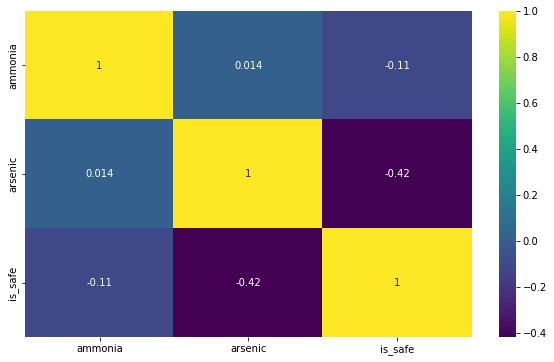

In [16]:
#untuk melihat korelasi data
k=len(df_tsk.columns)
cm=df_tsk.corr()
plt.figure(figsize=(10,6))
sns.heatmap(cm, annot=True, cmap='viridis')

# Fuzzyfikasi

In [17]:
def fungsi_segitiga(x, amb):
    """
    Fungsi Keanggotaan Segitiga.
    Parameter:
    ----------
    x   : Array 1 dimensi, semesta himpunan x  
    amb : Array 1 dimensi, terdiri dari 3 elemen a, m, b, yang mana a<=m<=b
    
    Hasil
    -------
    miu   : Array 1 dimensi fungsi keanggotaan segitiga 
    
    Fungsi keanggotaan segitiga:
    """
    assert len(amb) == 3, 'parameter amb harus tepat tiga elemen'
    a, m, b = np.r_[amb]    # Zero-indexing di Python
    assert a <= m and m <= b, 'paremeter harus memenuhi syarat berikut: a <= m <= b.'

    miu = np.zeros(len(x))

    # Sisi Kiri
    if a != m:
        idx = np.nonzero(np.logical_and(a < x, x < m))[0]
        miu[idx] = (x[idx] - a) / float(m - a)

    # Sisi Kanan
    if m != b:
        idx = np.nonzero(np.logical_and(m < x, x < b))[0]
        miu[idx] = (b - x[idx]) / float(b - m)

    idx = np.nonzero(x == m)
    miu[idx] = 1
    
    return miu

In [18]:
def miu_fungsi_segitiga(array_x, amb, x_i):
    """
    Fungsi Keanggotaan Segitiga.
    Parameter:
    ----------
    x   : Array 1 dimensi, semesta himpunan x  
    amb : Array 1 dimensi, terdiri dari 3 elemen a, m, b, yang mana a<=m<=b
    
    Hasil
    -------
    miu   : Array 1 dimensi fungsi keanggotaan segitiga 
    
    Fungsi keanggotaan segitiga:
    """
    assert len(amb) == 3, 'parameter amb harus tepat tiga elemen'
    a, m, b = np.r_[amb]    # Zero-indexing di Python
    assert a <= m and m <= b, 'paremeter harus memenuhi syarat berikut: a <= m <= b.'

    miu = np.zeros(len(array_x))

    # Sisi Kiri
    if a != m:
        idx = np.nonzero(np.logical_and(a < array_x, array_x < m))[0]
        miu[idx] = (array_x[idx] - a) / float(m - a)

    # Sisi Kanan
    if m != b:
        idx = np.nonzero(np.logical_and(m < array_x, array_x < b))[0]
        miu[idx] = (b - array_x[idx]) / float(b - m)

    idx = np.nonzero(array_x == m)
    miu[idx] = 1

    dict_fuzzy=res = {round(array_x[i],2): miu[i] for i in range(len(array_x))}
    print(dict_fuzzy)
    hasil = dict_fuzzy[int(x_i)]
    #hasil = dict_fuzzy[x_i]

    return hasil

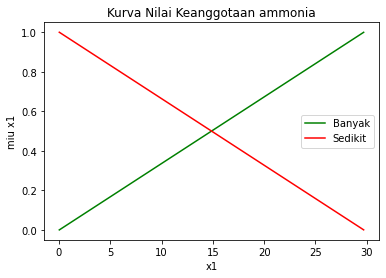

In [19]:
# Pembentukan Himpunan Fuzzy Ammonia [fungsi buat sendiri]
x_ammonia= np.arange(0.03, 29.72, 0.01) # Semesta Pembicaraan
amb_banyak = [0.03, 29.72, 29.72]
amb_sedikit = [0.03, 0.03, 29.72]

miu_ammonia_banyak = fungsi_segitiga(x_ammonia, amb_banyak)
miu_ammonia_sedikit = fungsi_segitiga(x_ammonia, amb_sedikit)

import matplotlib.pyplot as plt
plt.plot(x_ammonia, miu_ammonia_banyak, label = "Banyak", color='green')
plt.plot(x_ammonia, miu_ammonia_sedikit, label = "Sedikit", color='red')
plt.xlabel('x1')
plt.ylabel('miu x1')
plt.title('Kurva Nilai Keanggotaan ammonia')
plt.legend()
plt.show()

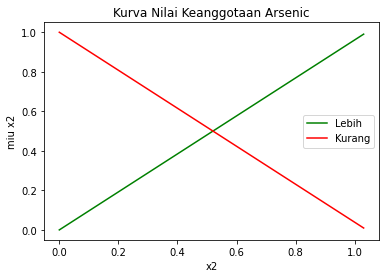

In [20]:
# Pembentukan Himpunan Fuzzy Arsenic [fungsi buat sendiri]
x_arsenic= np.arange(0, 1.04, 0.01) # Semesta Pembicaraan
amb_lebih  = [0, 1.04, 1.04]
amb_kurang = [0, 0, 1.04]

miu_arsenic_lebih  = fungsi_segitiga(x_arsenic, amb_lebih)
miu_arsenic_kurang = fungsi_segitiga(x_arsenic, amb_kurang)

import matplotlib.pyplot as plt
plt.plot(x_arsenic, miu_arsenic_lebih,  label = "Lebih",  color='green')
plt.plot(x_arsenic, miu_arsenic_kurang, label = "Kurang", color='red')
plt.xlabel('x2')
plt.ylabel('miu x2')
plt.title('Kurva Nilai Keanggotaan Arsenic')
plt.legend()
plt.show()

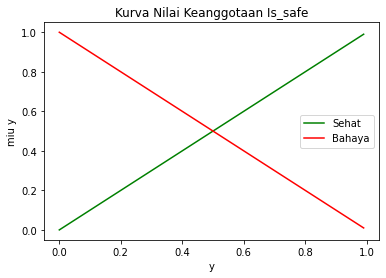

In [21]:
# Pembentukan Himpunan Fuzzy Is_safe [fungsi buat sendiri]
x_is_safe= np.arange(0, 1, 0.01) # Semesta Pembicaraan
amb_sehat  = [0, 1, 1]
amb_bahaya  = [0, 0, 1]

miu_is_safe_sehat  = fungsi_segitiga(x_is_safe, amb_sehat)
miu_is_safe_bahaya   = fungsi_segitiga(x_is_safe, amb_bahaya)

import matplotlib.pyplot as plt
plt.plot(x_is_safe, miu_is_safe_sehat,  label = "Sehat",  color='green')
plt.plot(x_is_safe, miu_is_safe_bahaya, label = "Bahaya", color='red')
plt.xlabel('y')
plt.ylabel('miu y')
plt.title('Kurva Nilai Keanggotaan Is_safe')
plt.legend()
plt.show()

In [22]:
def fuzzyfikasi(x_array, amd_1, amd_2, x, label_1, label_2):
    batas = (max(x_array)+min(x_array))/2
    print(batas)
    hasil=0
    if x < batas:
        hasil=miu_fungsi_segitiga(x_array, amd_1, x)
        label_hasil = label_1
    else:
        hasil=miu_fungsi_segitiga(x_array, amd_2, x)
        label_hasil = label_2
    return hasil, label_hasil

In [23]:
x_ammonia= np.arange(0, 29.72, 0.01)
amb_banyak = [0.03, 29.72, 29.72]
amb_sedikit = [0.03, 0.03, 29.72]

fuzzifikasi_ammonia=[]
miu_ammonia=[]
for i in df.ammonia:
    hasil=fuzzyfikasi(x_ammonia, amb_banyak, amb_sedikit, i, "Banyak", "Sedikit")
    fuzz = hasil[1]
    m = hasil[0]
    fuzzifikasi_ammonia.append(fuzz)
    miu_ammonia.append(m)
    
len(fuzzifikasi_ammonia)

14.855
{0.0: 0.0, 0.01: 0.0, 0.02: 0.0, 0.03: 0.0, 0.04: 0.00033681374200067373, 0.05: 0.0006736274840013475, 0.06: 0.0010104412260020209, 0.07: 0.001347254968002695, 0.08: 0.0016840687100033683, 0.09: 0.0020208824520040417, 0.1: 0.0023576961940047158, 0.11: 0.0026945099360053894, 0.12: 0.0030313236780060626, 0.13: 0.0033681374200067366, 0.14: 0.0037049511620074107, 0.15: 0.0040417649040080834, 0.16: 0.004378578646008758, 0.17: 0.0047153923880094315, 0.18: 0.005052206130010104, 0.19: 0.005389019872010779, 0.2: 0.005725833614011452, 0.21: 0.006062647356012125, 0.22: 0.0063994610980128, 0.23: 0.006736274840013473, 0.24: 0.007073088582014146, 0.25: 0.0074099023240148205, 0.26: 0.007746716066015494, 0.27: 0.008083529808016169, 0.28: 0.008420343550016841, 0.29: 0.008757157292017516, 0.3: 0.009093971034018189, 0.31: 0.009430784776018863, 0.32: 0.009767598518019538, 0.33: 0.01010441226002021, 0.34: 0.010441226002020885, 0.35: 0.01077803974402156, 0.36: 0.011114853486022229, 0.37: 0.0114516672

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{0.0: 0.0, 0.01: 0.0, 0.02: 0.0, 0.03: 0.0, 0.04: 0.00033681374200067373, 0.05: 0.0006736274840013475, 0.06: 0.0010104412260020209, 0.07: 0.001347254968002695, 0.08: 0.0016840687100033683, 0.09: 0.0020208824520040417, 0.1: 0.0023576961940047158, 0.11: 0.0026945099360053894, 0.12: 0.0030313236780060626, 0.13: 0.0033681374200067366, 0.14: 0.0037049511620074107, 0.15: 0.0040417649040080834, 0.16: 0.004378578646008758, 0.17: 0.0047153923880094315, 0.18: 0.005052206130010104, 0.19: 0.005389019872010779, 0.2: 0.005725833614011452, 0.21: 0.006062647356012125, 0.22: 0.0063994610980128, 0.23: 0.006736274840013473, 0.24: 0.007073088582014146, 0.25: 0.0074099023240148205, 0.26: 0.007746716066015494, 0.27: 0.008083529808016169, 0.28: 0.008420343550016841, 0.29: 0.008757157292017516, 0.3: 0.009093971034018189, 0.31: 0.009430784776018863, 0.32: 0.009767598518019538, 0.33: 0.01010441226002021, 0.34: 0.010441226002020885, 0.35: 0.01077803974402156, 0.36: 0.011114853486022229, 0.37: 0.01145166722802290

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{0.0: 0.0, 0.01: 0.0, 0.02: 0.0, 0.03: 0.0, 0.04: 0.00033681374200067373, 0.05: 0.0006736274840013475, 0.06: 0.0010104412260020209, 0.07: 0.001347254968002695, 0.08: 0.0016840687100033683, 0.09: 0.0020208824520040417, 0.1: 0.0023576961940047158, 0.11: 0.0026945099360053894, 0.12: 0.0030313236780060626, 0.13: 0.0033681374200067366, 0.14: 0.0037049511620074107, 0.15: 0.0040417649040080834, 0.16: 0.004378578646008758, 0.17: 0.0047153923880094315, 0.18: 0.005052206130010104, 0.19: 0.005389019872010779, 0.2: 0.005725833614011452, 0.21: 0.006062647356012125, 0.22: 0.0063994610980128, 0.23: 0.006736274840013473, 0.24: 0.007073088582014146, 0.25: 0.0074099023240148205, 0.26: 0.007746716066015494, 0.27: 0.008083529808016169, 0.28: 0.008420343550016841, 0.29: 0.008757157292017516, 0.3: 0.009093971034018189, 0.31: 0.009430784776018863, 0.32: 0.009767598518019538, 0.33: 0.01010441226002021, 0.34: 0.010441226002020885, 0.35: 0.01077803974402156, 0.36: 0.011114853486022229, 0.37: 0.01145166722802290

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{0.0: 0.0, 0.01: 0.0, 0.02: 0.0, 0.03: 0.0, 0.04: 0.00033681374200067373, 0.05: 0.0006736274840013475, 0.06: 0.0010104412260020209, 0.07: 0.001347254968002695, 0.08: 0.0016840687100033683, 0.09: 0.0020208824520040417, 0.1: 0.0023576961940047158, 0.11: 0.0026945099360053894, 0.12: 0.0030313236780060626, 0.13: 0.0033681374200067366, 0.14: 0.0037049511620074107, 0.15: 0.0040417649040080834, 0.16: 0.004378578646008758, 0.17: 0.0047153923880094315, 0.18: 0.005052206130010104, 0.19: 0.005389019872010779, 0.2: 0.005725833614011452, 0.21: 0.006062647356012125, 0.22: 0.0063994610980128, 0.23: 0.006736274840013473, 0.24: 0.007073088582014146, 0.25: 0.0074099023240148205, 0.26: 0.007746716066015494, 0.27: 0.008083529808016169, 0.28: 0.008420343550016841, 0.29: 0.008757157292017516, 0.3: 0.009093971034018189, 0.31: 0.009430784776018863, 0.32: 0.009767598518019538, 0.33: 0.01010441226002021, 0.34: 0.010441226002020885, 0.35: 0.01077803974402156, 0.36: 0.011114853486022229, 0.37: 0.01145166722802290

400

In [24]:
x_arsenic= np.arange(0, 1.04, 0.01) 
amb_lebih  = [0, 1.04, 1.04]
amb_kurang = [0, 0, 1.04]

    
fuzzifikasi_arsenic=[]
miu_arsenic=[]
for i in df.arsenic:
    hasil=fuzzyfikasi(x_arsenic, amb_lebih, amb_kurang, i, "Lebih", "Kurang")
    fuzz = hasil[1]
    m =hasil[0]
    fuzzifikasi_arsenic.append(fuzz)
    miu_arsenic.append(m)

len(fuzzifikasi_arsenic)

0.515
{0.0: 0.0, 0.01: 0.009615384615384616, 0.02: 0.019230769230769232, 0.03: 0.028846153846153844, 0.04: 0.038461538461538464, 0.05: 0.04807692307692308, 0.06: 0.05769230769230769, 0.07: 0.06730769230769232, 0.08: 0.07692307692307693, 0.09: 0.08653846153846154, 0.1: 0.09615384615384616, 0.11: 0.10576923076923077, 0.12: 0.11538461538461538, 0.13: 0.125, 0.14: 0.13461538461538464, 0.15: 0.14423076923076922, 0.16: 0.15384615384615385, 0.17: 0.16346153846153846, 0.18: 0.17307692307692307, 0.19: 0.18269230769230768, 0.2: 0.19230769230769232, 0.21: 0.2019230769230769, 0.22: 0.21153846153846154, 0.23: 0.22115384615384615, 0.24: 0.23076923076923075, 0.25: 0.24038461538461536, 0.26: 0.25, 0.27: 0.25961538461538464, 0.28: 0.2692307692307693, 0.29: 0.2788461538461538, 0.3: 0.28846153846153844, 0.31: 0.2980769230769231, 0.32: 0.3076923076923077, 0.33: 0.3173076923076923, 0.34: 0.3269230769230769, 0.35: 0.33653846153846156, 0.36: 0.34615384615384615, 0.37: 0.3557692307692307, 0.38: 0.365384615384

400

In [25]:
x_is_safe= np.arange(0, 2, 0.01)
amb_sehat  = [0, 1, 1]
amb_bahaya  = [0, 0, 1]

fuzzifikasi_is_safe=[]
miu_is_safe=[]
for i in df.is_safe:
    hasil=fuzzyfikasi(x_is_safe, amb_sehat, amb_bahaya, i, "Sehat", "Bahaya")
    fuzz = hasil[1]
    m = hasil[0]
    fuzzifikasi_is_safe.append(fuzz)
    miu_is_safe.append(m)
len(fuzzifikasi_is_safe)

0.995
{0.0: 1.0, 0.01: 0.99, 0.02: 0.98, 0.03: 0.97, 0.04: 0.96, 0.05: 0.95, 0.06: 0.94, 0.07: 0.9299999999999999, 0.08: 0.92, 0.09: 0.91, 0.1: 0.9, 0.11: 0.89, 0.12: 0.88, 0.13: 0.87, 0.14: 0.86, 0.15: 0.85, 0.16: 0.84, 0.17: 0.83, 0.18: 0.8200000000000001, 0.19: 0.81, 0.2: 0.8, 0.21: 0.79, 0.22: 0.78, 0.23: 0.77, 0.24: 0.76, 0.25: 0.75, 0.26: 0.74, 0.27: 0.73, 0.28: 0.72, 0.29: 0.71, 0.3: 0.7, 0.31: 0.69, 0.32: 0.6799999999999999, 0.33: 0.6699999999999999, 0.34: 0.6599999999999999, 0.35: 0.6499999999999999, 0.36: 0.64, 0.37: 0.63, 0.38: 0.62, 0.39: 0.61, 0.4: 0.6, 0.41: 0.59, 0.42: 0.5800000000000001, 0.43: 0.5700000000000001, 0.44: 0.56, 0.45: 0.55, 0.46: 0.54, 0.47: 0.53, 0.48: 0.52, 0.49: 0.51, 0.5: 0.5, 0.51: 0.49, 0.52: 0.48, 0.53: 0.47, 0.54: 0.45999999999999996, 0.55: 0.44999999999999996, 0.56: 0.43999999999999995, 0.57: 0.42999999999999994, 0.58: 0.42000000000000004, 0.59: 0.41000000000000003, 0.6: 0.4, 0.61: 0.39, 0.62: 0.38, 0.63: 0.37, 0.64: 0.36, 0.65: 0.35, 0.66: 0.33999

400

In [26]:
df_fuzz = pd.DataFrame({"Ammonia":df.ammonia,
                        "Arsenic":df.arsenic,
                        "Is_safe":df.is_safe,
                        "Ammonia_fuzz": fuzzifikasi_ammonia,
                       "Arsenic_fuzz": fuzzifikasi_arsenic,
                       "Is_safe_fuzz": fuzzifikasi_is_safe,
                       "miu_Ammonia":miu_ammonia,
                       "miu_Arsenic":miu_arsenic,
                       "miu_Is_safe":miu_is_safe})
df_fuzz

,Ammonia,Arsenic,Is_safe,Ammonia_fuzz,Arsenic_fuzz,Is_safe_fuzz,miu_Ammonia,miu_Arsenic,miu_Is_safe
0,9.08,0.04,1,Banyak,Lebih,Bahaya,0.302122,0.0,0.0
1,21.16,0.01,1,Sedikit,Lebih,Bahaya,0.293702,0.0,0.0
2,14.02,0.04,0,Banyak,Lebih,Sehat,0.470529,0.0,0.0
3,11.33,0.04,1,Banyak,Lebih,Bahaya,0.369485,0.0,0.0
4,24.33,0.03,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0
...,...,...,...,...,...,...,...,...,...
395,7.78,0.00,1,Banyak,Lebih,Bahaya,0.234759,0.0,0.0
396,24.22,0.02,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0
397,6.85,0.00,1,Banyak,Lebih,Bahaya,0.201078,0.0,0.0
398,10.00,0.01,1,Banyak,Lebih,Bahaya,0.335803,0.0,0.0


# Rule Generation

In [27]:
df_fuzz['Rule'] = "Jika X1 " + df_fuzz['Ammonia_fuzz'] + " dan X2 " + df_fuzz['Arsenic_fuzz'] + " maka Y " + df_fuzz['Is_safe_fuzz']
df_fuzz

,Ammonia,Arsenic,Is_safe,Ammonia_fuzz,Arsenic_fuzz,Is_safe_fuzz,miu_Ammonia,miu_Arsenic,miu_Is_safe,Rule
0,9.08,0.04,1,Banyak,Lebih,Bahaya,0.302122,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya
1,21.16,0.01,1,Sedikit,Lebih,Bahaya,0.293702,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya
2,14.02,0.04,0,Banyak,Lebih,Sehat,0.470529,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Sehat
3,11.33,0.04,1,Banyak,Lebih,Bahaya,0.369485,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya
4,24.33,0.03,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya
...,...,...,...,...,...,...,...,...,...,...
395,7.78,0.00,1,Banyak,Lebih,Bahaya,0.234759,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya
396,24.22,0.02,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya
397,6.85,0.00,1,Banyak,Lebih,Bahaya,0.201078,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya
398,10.00,0.01,1,Banyak,Lebih,Bahaya,0.335803,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya


In [28]:
df_fuzz.to_csv('hasilRule.csv') 

In [29]:
df_fuzz['Rule'].value_counts()

Jika X1 Sedikit dan X2 Lebih maka Y Sehat      101
Jika X1 Banyak dan X2 Lebih maka Y Sehat        74
Jika X1 Banyak dan X2 Kurang maka Y Sehat       68
Jika X1 Sedikit dan X2 Kurang maka Y Sehat      62
Jika X1 Banyak dan X2 Lebih maka Y Bahaya       49
Jika X1 Sedikit dan X2 Lebih maka Y Bahaya      38
Jika X1 Banyak dan X2 Kurang maka Y Bahaya       5
Jika X1 Sedikit dan X2 Kurang maka Y Bahaya      3
Name: Rule, dtype: int64

# TSK Prediction

In [30]:
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

##Rule 1

In [31]:
# Rule 1
rule_1 = df_fuzz[df_fuzz['Rule']=="Jika X1 Sedikit dan X2 Lebih maka Y Sehat"]
index=rule_1.index

data_rule_1=df_fuzz.iloc[index,:3]

X1=np.array(data_rule_1.iloc[::,:-1])
#Y=np.array(data_rule_1.iloc[::,:1])
Y1=np.array(data_rule_1.iloc[:,2])

data_rule_1

,Ammonia,Arsenic,Is_safe
7,19.87,0.040,0
20,15.75,0.030,0
21,29.29,0.001,0
26,19.90,0.030,0
28,22.32,0.010,0
...,...,...,...
368,25.93,0.030,0
379,18.79,0.080,0
381,21.01,0.020,0
382,15.42,0.020,0


In [32]:
data_rule_1.to_csv('hasilrule1.csv') 

###MINI BATCH GRADIENT DESCENT

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split 
%matplotlib inline

In [34]:
df_rule1=pd.read_csv('hasilrule1.csv',sep=',')
df_rule1

,Unnamed: 0,Ammonia,Arsenic,Is_safe
0,7,19.87,0.040,0
1,20,15.75,0.030,0
2,21,29.29,0.001,0
3,26,19.90,0.030,0
4,28,22.32,0.010,0
...,...,...,...,...
96,368,25.93,0.030,0
97,379,18.79,0.080,0
98,381,21.01,0.020,0
99,382,15.42,0.020,0


In [35]:
df_rule1=df_rule1.drop(columns=['Unnamed: 0'])      #diilangin kolom
df_rule1

,Ammonia,Arsenic,Is_safe
0,19.87,0.040,0
1,15.75,0.030,0
2,29.29,0.001,0
3,19.90,0.030,0
4,22.32,0.010,0
...,...,...,...
96,25.93,0.030,0
97,18.79,0.080,0
98,21.01,0.020,0
99,15.42,0.020,0


In [36]:
from sklearn import preprocessing
sx1 = preprocessing.MinMaxScaler()
sy1 = preprocessing.MinMaxScaler()

scaled_X1 = sx1.fit_transform(data_rule_1.drop('Is_safe',axis='columns'))
scaled_y1 = sy1.fit_transform(data_rule_1['Is_safe'].values.reshape(rule_1.shape[0],1))

scaled_X1

array([[0.32764505, 0.07662083],
       [0.04641638, 0.05697446],
       [0.97064846, 0.        ],
       [0.32969283, 0.05697446],
       [0.49488055, 0.01768173],
       [0.89556314, 0.        ],
       [0.93993174, 0.01768173],
       [0.24368601, 0.07662083],
       [0.42116041, 0.09626719],
       [0.92013652, 0.03732809],
       [0.2662116 , 0.07662083],
       [0.10853242, 0.        ],
       [0.25392491, 0.03732809],
       [0.90238908, 0.01768173],
       [0.50784983, 0.07662083],
       [0.03754266, 0.03732809],
       [0.46211604, 0.05697446],
       [0.53037543, 0.01768173],
       [0.54266212, 0.05697446],
       [0.59317406, 1.        ],
       [0.8996587 , 0.37131631],
       [0.16245734, 0.4891945 ],
       [0.75494881, 0.56777996],
       [0.34675768, 0.86247544],
       [0.28395904, 0.27308448],
       [0.18566553, 0.9410609 ],
       [0.04300341, 0.78388998],
       [0.00887372, 0.62671906],
       [0.83276451, 0.66601179],
       [0.26279863, 0.78388998],
       [0.

In [37]:
scaled_y1_reshape=scaled_y1.reshape(scaled_y1.shape[0],)
scaled_y1_reshape

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [38]:
def mini_batch_gradient_descent_rule1(X1, y1, iterasi, batch_size = 5, learning_rate = 0.1):

    jumlah_variabel_rule1 = X1.shape[1]                   # array numpy dengan 1 baris dan sejumlah kolom variabel
                                                   # Contoh: X_array([[1,2], [3,4], [5,5], [6,6], [7,2], [8,1]])
    
    bpoly_rule1 = np.ones(shape=(jumlah_variabel_rule1))       # b1, b2, ... b(jumlah variabel)
    b0_rule1 = 0                                         # b0 atau bias
    n = X1.shape[0]                                 # jumlah baris data X
    
    if batch_size > n: 
        batch_size = n                             # Jika batch size > n maka akan menjadi bacth gradient descent biasa
        
    cost_rule1_list = []                                 # list untuk menampung nilai cost setiap iterasi
    iterasi_rule1_list = []                              # list untuk menampung nilai n iterasi(1, 2, 3, ..., n)
    b_rule1_list=[]                                      # list untuk menampung nilai parameter regresi b0, b1, .. b(jumlah_variabel) 
                                                   # setiap iterasi
    
    jumlah_batch_rule1 = int(n/batch_size)
    
    # Program akan berjalan hingga sejumlah iterasi=n dicapai
    for i in range(iterasi):  
        
        random_indices = np.random.RandomState(seed=42).permutation(n)      # Memilih indeks data random untuk update parameter
        X1_smntr = X1[random_indices]
        y1_smntr = y1[random_indices]
        
        for j in range(0, n, batch_size):
            Xj_rule1 = X1_smntr[j:j+batch_size]
            yj_rule1 = y1_smntr[j:j+batch_size]
            
            y1_pred = np.dot(bpoly_rule1, Xj_rule1.T) + b0_rule1           # Menghitung y_pred pada setiap iterasi
        
            bpoly_rule1_grad = -(2/len(Xj_rule1))*(Xj_rule1.T.dot(yj_rule1-y1_pred))   # Menghitung perubahan/gradien bpoly setiap iterasi
            b0_rule1_grad = -(2/len(Xj_rule1))*np.sum(yj_rule1-y1_pred)          # Menghitung perubahan/gradien b0 setiap iterasi
            bpoly_rule1 = bpoly_rule1 - learning_rate * bpoly_rule1_grad        # Memperbaharui bpoly setiap iterasi
            b0_rule1 = b0_rule1 - learning_rate * b0_rule1_grad                 # Memperbaharui bpoly setiap iterasi
        
            # Menyimpan parameter b dalam list tunggal
            bp=[]
            for jv_rule1 in range(jumlah_variabel_rule1):
                bp_rule1=bpoly_rule1[jv_rule1]
                bp.append(bp_rule1)
            b_rule1=[b0_rule1]+bp
        
            cost_rule1 = np.mean(np.square(yj_rule1-y1_pred))       # MSE (Mean Squared Error)
        
        if i%100==0: # Hanya mengambil hasil pada iterasi kelipatan 10
            cost_rule1_list.append(cost_rule1)                     # Menyimpan nilai cost setiap iterasi
            iterasi_rule1_list.append(i)                     # Menyimpan nilai iterasi setiap iterasi
            b_rule1_list.append(b_rule1)                           # Menyimpan nilai parameter b setiap iterasi
        
    return bpoly_rule1, b0_rule1, cost_rule1, b_rule1_list, cost_rule1_list, iterasi_rule1_list  # Output

In [39]:
import time
mulai_rule1 = time.time()
mb_bpoly_rule1, mb_b0_rule1, mb_cost_rule1, mb_b_rule1_list, mb_cost_rule1_list, mb_iterasi_rule1_list=mini_batch_gradient_descent_rule1 (scaled_X1, 
                                                                                                                                        scaled_y1_reshape,
                                                                                                                                        iterasi=10000, 
                                                                                                                                        batch_size = 5, 
                                                                                                                                        learning_rate = 0.1)
selesai_rule1 = time.time()
waktu_komputasi_rule1 = (selesai_rule1 - mulai_rule1)
print("Waktu Komputasi Rule 1: ",waktu_komputasi_rule1)

Waktu Komputasi Rule 1:  10.188847541809082


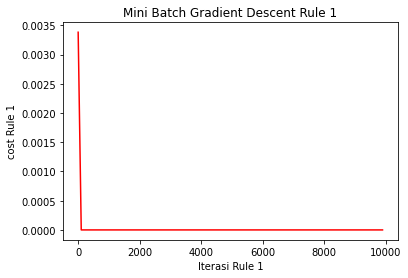

In [40]:
plt.xlabel("Iterasi Rule 1")
plt.ylabel("cost Rule 1")
plt.title("Mini Batch Gradient Descent Rule 1")
plt.plot(mb_iterasi_rule1_list,mb_cost_rule1_list, color='red', label='Eror')
plt.show()

In [41]:
mb_cost_rule1

0.0

In [42]:
mb_b0_rule1

-3e-323

In [43]:
mb_bpoly_rule1 #hasil untuk x1 dan x2

array([2.5e-323, 4.0e-323])

In [44]:
data_rule_1

,Ammonia,Arsenic,Is_safe
7,19.87,0.040,0
20,15.75,0.030,0
21,29.29,0.001,0
26,19.90,0.030,0
28,22.32,0.010,0
...,...,...,...
368,25.93,0.030,0
379,18.79,0.080,0
381,21.01,0.020,0
382,15.42,0.020,0


In [45]:
X1=np.array(data_rule_1.iloc[::,:-1])
X1

array([[1.987e+01, 4.000e-02],
       [1.575e+01, 3.000e-02],
       [2.929e+01, 1.000e-03],
       [1.990e+01, 3.000e-02],
       [2.232e+01, 1.000e-02],
       [2.819e+01, 1.000e-03],
       [2.884e+01, 1.000e-02],
       [1.864e+01, 4.000e-02],
       [2.124e+01, 5.000e-02],
       [2.855e+01, 2.000e-02],
       [1.897e+01, 4.000e-02],
       [1.666e+01, 1.000e-03],
       [1.879e+01, 2.000e-02],
       [2.829e+01, 1.000e-02],
       [2.251e+01, 4.000e-02],
       [1.562e+01, 2.000e-02],
       [2.184e+01, 3.000e-02],
       [2.284e+01, 1.000e-02],
       [2.302e+01, 3.000e-02],
       [2.376e+01, 5.100e-01],
       [2.825e+01, 1.900e-01],
       [1.745e+01, 2.500e-01],
       [2.613e+01, 2.900e-01],
       [2.015e+01, 4.400e-01],
       [1.923e+01, 1.400e-01],
       [1.779e+01, 4.800e-01],
       [1.570e+01, 4.000e-01],
       [1.520e+01, 3.200e-01],
       [2.727e+01, 3.400e-01],
       [1.892e+01, 4.000e-01],
       [1.988e+01, 2.400e-01],
       [2.900e+01, 4.100e-01],
       [

In [46]:
Y1=np.array(data_rule_1.iloc[:,2])  #mengambil angka dari kolom
Y1

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [47]:
# Membuat model regressi dengan library Scikit Learn
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree = 2)  ## nantinya degree diganti menjadi 4
X1_poly = poly_reg.fit_transform(X1)
lin_reg_2 = LinearRegression()
lin_reg_2.fit(X1_poly, Y1) 
# Proses Training Model
poly_reg.fit(X1, Y1) 

# Memprediksi hasil dengan regresi polynomial
y1_pred=lin_reg_2.predict(poly_reg.fit_transform(X1))
y1_pred

data_rule_1['pred'] = y1_pred
data_rule_1

,Ammonia,Arsenic,Is_safe,pred
7,19.87,0.040,0,0.0
20,15.75,0.030,0,0.0
21,29.29,0.001,0,0.0
26,19.90,0.030,0,0.0
28,22.32,0.010,0,0.0
...,...,...,...,...
368,25.93,0.030,0,0.0
379,18.79,0.080,0,0.0
381,21.01,0.020,0,0.0
382,15.42,0.020,0,0.0


##Rule 2


In [48]:
# Rule 2
rule_2 = df_fuzz[df_fuzz['Rule']=="Jika X1 Banyak dan X2 Lebih maka Y Sehat"]
index=rule_2.index
data_rule_2=df_fuzz.iloc[index,:3]
data_rule_2

,Ammonia,Arsenic,Is_safe
2,14.02,0.040,0
6,5.60,0.010,0
10,3.60,0.001,0
25,13.08,0.040,0
27,9.49,0.050,0
...,...,...,...
378,5.41,0.060,0
383,1.62,0.000,0
386,0.12,0.040,0
387,8.04,0.030,0


In [49]:
data_rule_2.to_csv('hasilrule2.csv') 

###MINI BATCH GRADIENT DESCENT

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split 
%matplotlib inline

In [51]:
df_rule2=pd.read_csv('hasilrule2.csv',sep=',')
df_rule2

,Unnamed: 0,Ammonia,Arsenic,Is_safe
0,2,14.02,0.040,0
1,6,5.60,0.010,0
2,10,3.60,0.001,0
3,25,13.08,0.040,0
4,27,9.49,0.050,0
...,...,...,...,...
69,378,5.41,0.060,0
70,383,1.62,0.000,0
71,386,0.12,0.040,0
72,387,8.04,0.030,0


In [52]:
df_rule2=df_rule2.drop(columns=['Unnamed: 0'])
df_rule2

,Ammonia,Arsenic,Is_safe
0,14.02,0.040,0
1,5.60,0.010,0
2,3.60,0.001,0
3,13.08,0.040,0
4,9.49,0.050,0
...,...,...,...
69,5.41,0.060,0
70,1.62,0.000,0
71,0.12,0.040,0
72,8.04,0.030,0


In [53]:
from sklearn import preprocessing
sx2 = preprocessing.MinMaxScaler()
sy2 = preprocessing.MinMaxScaler()

scaled_X2 = sx2.fit_transform(data_rule_2.drop('Is_safe',axis='columns'))
scaled_y2 = sy2.fit_transform(data_rule_2['Is_safe'].values.reshape(rule_2.shape[0],1))

scaled_X2

array([[0.94493542, 0.07843137],
       [0.37253569, 0.01960784],
       [0.23657376, 0.00196078],
       [0.88103331, 0.07843137],
       [0.63698165, 0.09803922],
       [0.92590075, 0.03921569],
       [0.72807614, 0.01960784],
       [0.23181509, 0.05882353],
       [0.93269884, 0.01960784],
       [0.99728076, 0.07843137],
       [0.88783141, 0.03921569],
       [0.66961251, 0.60784314],
       [0.39632903, 0.47058824],
       [0.774983  , 0.07843137],
       [0.97756628, 0.31372549],
       [0.64717879, 0.7254902 ],
       [0.50781781, 0.78431373],
       [0.08293678, 0.09803922],
       [0.92590075, 0.01960784],
       [0.31543168, 0.07843137],
       [0.0210741 , 0.09803922],
       [0.63222298, 0.43137255],
       [0.96397009, 0.92156863],
       [0.47994562, 0.2745098 ],
       [0.6199864 , 0.2745098 ],
       [0.41060503, 0.74509804],
       [0.37729436, 0.29411765],
       [0.21889871, 0.31372549],
       [0.10333107, 0.74509804],
       [0.14411965, 0.09803922],
       [0.

In [54]:
scaled_y2_reshape=scaled_y2.reshape(scaled_y2.shape[0],)
scaled_y2_reshape

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [55]:
def mini_batch_gradient_descent_rule2(X2, y2, iterasi, batch_size = 5, learning_rate = 0.01):

    jumlah_variabel_rule2 = X2.shape[1]                   # array numpy dengan 1 baris dan sejumlah kolom variabel
                                                   # Contoh: X_array([[1,2], [3,4], [5,5], [6,6], [7,2], [8,1]])
    
    bpoly_rule2 = np.ones(shape=(jumlah_variabel_rule2))       # b1, b2, ... b(jumlah variabel)
    b0_rule2 = 0                                         # b0 atau bias
    n = X2.shape[0]                                 # jumlah baris data X
    
    if batch_size > n: 
        batch_size = n                             # Jika batch size > n maka akan menjadi bacth gradient descent biasa
        
    cost_rule2_list = []                                 # list untuk menampung nilai cost setiap iterasi
    iterasi_rule2_list = []                              # list untuk menampung nilai n iterasi(1, 2, 3, ..., n)
    b_rule2_list=[]                                      # list untuk menampung nilai parameter regresi b0, b1, .. b(jumlah_variabel) 
                                                   # setiap iterasi
    
    jumlah_batch_rule2 = int(n/batch_size)
    
    # Program akan berjalan hingga sejumlah iterasi=n dicapai
    for i in range(iterasi):  
        
        random_indices = np.random.RandomState(seed=42).permutation(n)      # Memilih indeks data random untuk update parameter
        X2_smntr = X2[random_indices]
        y2_smntr = y2[random_indices]
        
        for j in range(0, n, batch_size):
            Xj_rule2 = X2_smntr[j:j+batch_size]
            yj_rule2 = y2_smntr[j:j+batch_size]
            
            y2_pred = np.dot(bpoly_rule2, Xj_rule2.T) + b0_rule2           # Menghitung y_pred pada setiap iterasi
        
            bpoly_rule2_grad = -(2/len(Xj_rule2))*(Xj_rule2.T.dot(yj_rule2-y2_pred))   # Menghitung perubahan/gradien bpoly setiap iterasi
            b0_rule2_grad = -(2/len(Xj_rule2))*np.sum(yj_rule2-y2_pred)          # Menghitung perubahan/gradien b0 setiap iterasi
            bpoly_rule2 = bpoly_rule2 - learning_rate * bpoly_rule2_grad        # Memperbaharui bpoly setiap iterasi
            b0_rule2 = b0_rule2 - learning_rate * b0_rule2_grad                 # Memperbaharui bpoly setiap iterasi
        
            # Menyimpan parameter b dalam list tunggal
            bp=[]
            for jv_rule2 in range(jumlah_variabel_rule2):
                bp_rule2=bpoly_rule2[jv_rule2]
                bp.append(bp_rule2)
            b_rule2=[b0_rule2]+bp
        
            cost_rule2 = np.mean(np.square(yj_rule2-y2_pred))       # MSE (Mean Squared Error)
        
        if i%100==0: # Hanya mengambil hasil pada iterasi kelipatan 10
            cost_rule2_list.append(cost_rule2)                     # Menyimpan nilai cost setiap iterasi
            iterasi_rule2_list.append(i)                     # Menyimpan nilai iterasi setiap iterasi
            b_rule2_list.append(b_rule2)                           # Menyimpan nilai parameter b setiap iterasi
        
    return bpoly_rule2, b0_rule2, cost_rule2, b_rule2_list, cost_rule2_list, iterasi_rule2_list  # Output

In [56]:
import time
mulai_rule2 = time.time()
mb_bpoly_rule2, mb_b0_rule2, mb_cost_rule2, mb_b_rule2_list, mb_cost_rule2_list, mb_iterasi_rule2_list=mini_batch_gradient_descent_rule2 (scaled_X2, 
                                                                                                                                        scaled_y2_reshape,
                                                                                                                                        iterasi=10000, 
                                                                                                                                        batch_size = 3, 
                                                                                                                                        learning_rate = 0.01)
selesai_rule2 = time.time()
waktu_komputasi_rule2 = (selesai_rule2 - mulai_rule2)
print("Waktu Komputasi Rule 2: ",waktu_komputasi_rule2)

Waktu Komputasi Rule 2:  10.634588718414307


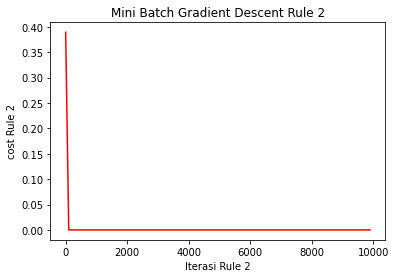

In [57]:
plt.xlabel("Iterasi Rule 2")
plt.ylabel("cost Rule 2")
plt.title("Mini Batch Gradient Descent Rule 2")
plt.plot(mb_iterasi_rule2_list,mb_cost_rule2_list, color='red', label='Eror')
plt.show()

In [58]:
mb_cost_rule2

4.496443312828469e-287

In [59]:
mb_b0_rule2

-1.8772351339834623e-143

In [60]:
mb_bpoly_rule2 #hasil untuk x1 dan x2

array([2.26881034e-143, 1.58727679e-143])

In [61]:
data_rule_2

,Ammonia,Arsenic,Is_safe
2,14.02,0.040,0
6,5.60,0.010,0
10,3.60,0.001,0
25,13.08,0.040,0
27,9.49,0.050,0
...,...,...,...
378,5.41,0.060,0
383,1.62,0.000,0
386,0.12,0.040,0
387,8.04,0.030,0


In [62]:
X2=np.array(data_rule_2.iloc[::,:-1])
X2

array([[1.402e+01, 4.000e-02],
       [5.600e+00, 1.000e-02],
       [3.600e+00, 1.000e-03],
       [1.308e+01, 4.000e-02],
       [9.490e+00, 5.000e-02],
       [1.374e+01, 2.000e-02],
       [1.083e+01, 1.000e-02],
       [3.530e+00, 3.000e-02],
       [1.384e+01, 1.000e-02],
       [1.479e+01, 4.000e-02],
       [1.318e+01, 2.000e-02],
       [9.970e+00, 3.100e-01],
       [5.950e+00, 2.400e-01],
       [1.152e+01, 4.000e-02],
       [1.450e+01, 1.600e-01],
       [9.640e+00, 3.700e-01],
       [7.590e+00, 4.000e-01],
       [1.340e+00, 5.000e-02],
       [1.374e+01, 1.000e-02],
       [4.760e+00, 4.000e-02],
       [4.300e-01, 5.000e-02],
       [9.420e+00, 2.200e-01],
       [1.430e+01, 4.700e-01],
       [7.180e+00, 1.400e-01],
       [9.240e+00, 1.400e-01],
       [6.160e+00, 3.800e-01],
       [5.670e+00, 1.500e-01],
       [3.340e+00, 1.600e-01],
       [1.640e+00, 3.800e-01],
       [2.240e+00, 5.000e-02],
       [3.950e+00, 4.100e-01],
       [1.045e+01, 3.800e-01],
       [

In [63]:
Y2=np.array(data_rule_2.iloc[:,2])
Y2

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

In [64]:
# Membuat model regressi dengan library Scikit Learn
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree = 2)  ## nantinya degree diganti menjadi 4
X2_poly = poly_reg.fit_transform(X2)
lin_reg_2 = LinearRegression()
lin_reg_2.fit(X2_poly, Y2) 
# Proses Training Model
poly_reg.fit(X2, Y2) 

# Memprediksi hasil dengan regresi polynomial
# Memprediksi hasil dengan regresi polynomial
y2_pred=lin_reg_2.predict(poly_reg.fit_transform(X2))
y2_pred

data_rule_2['pred'] = y2_pred
data_rule_2

,Ammonia,Arsenic,Is_safe,pred
2,14.02,0.040,0,0.0
6,5.60,0.010,0,0.0
10,3.60,0.001,0,0.0
25,13.08,0.040,0,0.0
27,9.49,0.050,0,0.0
...,...,...,...,...
378,5.41,0.060,0,0.0
383,1.62,0.000,0,0.0
386,0.12,0.040,0,0.0
387,8.04,0.030,0,0.0


##Rule 3

In [65]:
# Rule 3
rule_3 = df_fuzz[df_fuzz['Rule']=="Jika X1 Banyak dan X2 Kurang maka Y Sehat"]
index=rule_3.index

data_rule_3=df_fuzz.iloc[index,:3]
data_rule_3

,Ammonia,Arsenic,Is_safe
78,3.01,0.90,0
80,9.00,0.78,0
102,13.12,0.83,0
105,11.20,0.56,0
110,13.81,0.81,0
...,...,...,...
327,5.35,0.53,0
336,0.30,0.75,0
337,9.80,0.90,0
339,9.39,0.86,0


In [66]:
data_rule_3.to_csv('hasilrule3.csv') 

###MINI BATCH GRADIENT DESCENT

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split 
%matplotlib inline

In [68]:
df_rule3=pd.read_csv('hasilrule3.csv',sep=',')
df_rule3

,Unnamed: 0,Ammonia,Arsenic,Is_safe
0,78,3.01,0.90,0
1,80,9.00,0.78,0
2,102,13.12,0.83,0
3,105,11.20,0.56,0
4,110,13.81,0.81,0
...,...,...,...,...
63,327,5.35,0.53,0
64,336,0.30,0.75,0
65,337,9.80,0.90,0
66,339,9.39,0.86,0


In [69]:
df_rule3=df_rule3.drop(columns=['Unnamed: 0'])
df_rule3

,Ammonia,Arsenic,Is_safe
0,3.01,0.90,0
1,9.00,0.78,0
2,13.12,0.83,0
3,11.20,0.56,0
4,13.81,0.81,0
...,...,...,...
63,5.35,0.53,0
64,0.30,0.75,0
65,9.80,0.90,0
66,9.39,0.86,0


In [70]:
from sklearn import preprocessing
sx3 = preprocessing.MinMaxScaler()
sy3 = preprocessing.MinMaxScaler()

scaled_X3 = sx3.fit_transform(data_rule_3.drop('Is_safe',axis='columns'))
scaled_y3 = sy3.fit_transform(data_rule_3['Is_safe'].values.reshape(rule_3.shape[0],1))

scaled_X3

array([[0.20495186, 0.74509804],
       [0.61691884, 0.50980392],
       [0.9002751 , 0.60784314],
       [0.76822558, 0.07843137],
       [0.9477304 , 0.56862745],
       [0.8480055 , 0.2745098 ],
       [0.54883081, 0.60784314],
       [0.9869326 , 0.7254902 ],
       [0.64236589, 0.88235294],
       [1.        , 0.21568627],
       [0.50481431, 0.60784314],
       [0.22008253, 0.03921569],
       [0.56671252, 0.31372549],
       [0.50412655, 0.76470588],
       [0.05295736, 0.82352941],
       [0.78335626, 0.90196078],
       [0.03851444, 0.15686275],
       [0.78335626, 0.68627451],
       [0.22764787, 0.25490196],
       [0.41953232, 1.        ],
       [0.52338377, 0.84313725],
       [0.28129298, 0.39215686],
       [0.58321871, 0.41176471],
       [0.36176066, 0.05882353],
       [0.02338377, 0.37254902],
       [0.77028886, 0.49019608],
       [0.65268226, 0.07843137],
       [0.84938102, 0.29411765],
       [0.81911967, 0.07843137],
       [0.1127923 , 0.07843137],
       [0.

In [71]:
scaled_y3_reshape=scaled_y3.reshape(scaled_y3.shape[0],)
scaled_y3_reshape

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [72]:
def mini_batch_gradient_descent_rule3(X3, y3, iterasi, batch_size = 5, learning_rate = 0.01):

    jumlah_variabel_rule3 = X3.shape[1]                   # array numpy dengan 1 baris dan sejumlah kolom variabel
                                                   # Contoh: X_array([[1,2], [3,4], [5,5], [6,6], [7,2], [8,1]])
    
    bpoly_rule3 = np.ones(shape=(jumlah_variabel_rule3))       # b1, b2, ... b(jumlah variabel)
    b0_rule3 = 0                                         # b0 atau bias
    n = X3.shape[0]                                 # jumlah baris data X
    
    if batch_size > n: 
        batch_size = n                             # Jika batch size > n maka akan menjadi bacth gradient descent biasa
        
    cost_rule3_list = []                                 # list untuk menampung nilai cost setiap iterasi
    iterasi_rule3_list = []                              # list untuk menampung nilai n iterasi(1, 2, 3, ..., n)
    b_rule3_list=[]                                      # list untuk menampung nilai parameter regresi b0, b1, .. b(jumlah_variabel) 
                                                   # setiap iterasi
    
    jumlah_batch_rule3 = int(n/batch_size)
    
    # Program akan berjalan hingga sejumlah iterasi=n dicapai
    for i in range(iterasi):  
        
        random_indices = np.random.RandomState(seed=42).permutation(n)      # Memilih indeks data random untuk update parameter
        X3_smntr = X3[random_indices]
        y3_smntr = y3[random_indices]
        
        for j in range(0, n, batch_size):
            Xj_rule3 = X3_smntr[j:j+batch_size]
            yj_rule3 = y3_smntr[j:j+batch_size]
            
            y3_pred = np.dot(bpoly_rule3, Xj_rule3.T) + b0_rule3           # Menghitung y_pred pada setiap iterasi
        
            bpoly_rule3_grad = -(2/len(Xj_rule3))*(Xj_rule3.T.dot(yj_rule3-y3_pred))   # Menghitung perubahan/gradien bpoly setiap iterasi
            b0_rule3_grad = -(2/len(Xj_rule3))*np.sum(yj_rule3-y3_pred)          # Menghitung perubahan/gradien b0 setiap iterasi
            bpoly_rule3 = bpoly_rule3 - learning_rate * bpoly_rule3_grad        # Memperbaharui bpoly setiap iterasi
            b0_rule3 = b0_rule3 - learning_rate * b0_rule3_grad                 # Memperbaharui bpoly setiap iterasi
        
            # Menyimpan parameter b dalam list tunggal
            bp=[]
            for jv_rule3 in range(jumlah_variabel_rule3):
                bp_rule3=bpoly_rule3[jv_rule3]
                bp.append(bp_rule3)
            b_rule3=[b0_rule3]+bp
        
            cost_rule3 = np.mean(np.square(yj_rule3-y3_pred))       # MSE (Mean Squared Error)
        
        if i%100==0: # Hanya mengambil hasil pada iterasi kelipatan 10
            cost_rule3_list.append(cost_rule3)                     # Menyimpan nilai cost setiap iterasi
            iterasi_rule3_list.append(i)                     # Menyimpan nilai iterasi setiap iterasi
            b_rule3_list.append(b_rule3)                           # Menyimpan nilai parameter b setiap iterasi
        
    return bpoly_rule3, b0_rule3, cost_rule3, b_rule3_list, cost_rule3_list, iterasi_rule3_list  # Output

In [73]:
import time
mulai_rule3 = time.time()
mb_bpoly_rule3, mb_b0_rule3, mb_cost_rule3, mb_b_rule3_list, mb_cost_rule3_list, mb_iterasi_rule3_list=mini_batch_gradient_descent_rule3 (scaled_X3, 
                                                                                                                                        scaled_y3_reshape,
                                                                                                                                        iterasi=10000, 
                                                                                                                                        batch_size = 3, 
                                                                                                                                        learning_rate = 0.01)
selesai_rule3 = time.time()
waktu_komputasi_rule3 = (selesai_rule3 - mulai_rule3)
print("Waktu Komputasi Rule 3: ",waktu_komputasi_rule3)

Waktu Komputasi Rule 3:  9.986212015151978


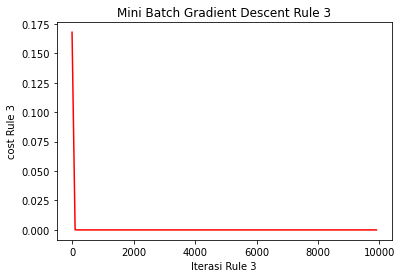

In [74]:
plt.xlabel("Iterasi Rule 3")
plt.ylabel("cost Rule 3")
plt.title("Mini Batch Gradient Descent Rule 3")
plt.plot(mb_iterasi_rule3_list,mb_cost_rule3_list, color='red', label='Eror')
plt.show()

In [75]:
mb_cost_rule3

6.140729249002388e-213

In [76]:
mb_b0_rule3

-5.037423396652198e-106

In [77]:
mb_bpoly_rule3 #hasil untuk x1 dan x2

array([4.88875697e-106, 4.65589251e-106])

In [78]:
data_rule_3

,Ammonia,Arsenic,Is_safe
78,3.01,0.90,0
80,9.00,0.78,0
102,13.12,0.83,0
105,11.20,0.56,0
110,13.81,0.81,0
...,...,...,...
327,5.35,0.53,0
336,0.30,0.75,0
337,9.80,0.90,0
339,9.39,0.86,0


In [79]:
X3=np.array(data_rule_3.iloc[::,:-1])
X3

array([[ 3.01,  0.9 ],
       [ 9.  ,  0.78],
       [13.12,  0.83],
       [11.2 ,  0.56],
       [13.81,  0.81],
       [12.36,  0.66],
       [ 8.01,  0.83],
       [14.38,  0.89],
       [ 9.37,  0.97],
       [14.57,  0.63],
       [ 7.37,  0.83],
       [ 3.23,  0.54],
       [ 8.27,  0.68],
       [ 7.36,  0.91],
       [ 0.8 ,  0.94],
       [11.42,  0.98],
       [ 0.59,  0.6 ],
       [11.42,  0.87],
       [ 3.34,  0.65],
       [ 6.13,  1.03],
       [ 7.64,  0.95],
       [ 4.12,  0.72],
       [ 8.51,  0.73],
       [ 5.29,  0.55],
       [ 0.37,  0.71],
       [11.23,  0.77],
       [ 9.52,  0.56],
       [12.38,  0.67],
       [11.94,  0.56],
       [ 1.67,  0.56],
       [12.11,  0.76],
       [ 8.47,  0.97],
       [ 2.88,  0.56],
       [ 6.35,  0.76],
       [11.88,  0.81],
       [10.32,  0.57],
       [12.28,  0.83],
       [11.2 ,  0.62],
       [ 6.12,  0.99],
       [ 1.95,  0.64],
       [ 7.13,  1.  ],
       [ 8.79,  0.73],
       [11.93,  0.85],
       [ 2.

In [80]:
Y3=np.array(data_rule_3.iloc[:,2])
Y3

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [81]:
# Membuat model regressi dengan library Scikit Learn
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree = 2)  ## nantinya degree diganti menjadi 4
X3_poly = poly_reg.fit_transform(X3)
lin_reg_2 = LinearRegression()
lin_reg_2.fit(X3_poly, Y3) 
# Proses Training Model
poly_reg.fit(X3, Y3) 

# Memprediksi hasil dengan regresi polynomial
y3_pred=lin_reg_2.predict(poly_reg.fit_transform(X3))
y3_pred

data_rule_3['pred'] = y3_pred
data_rule_3

,Ammonia,Arsenic,Is_safe,pred
78,3.01,0.90,0,0.0
80,9.00,0.78,0,0.0
102,13.12,0.83,0,0.0
105,11.20,0.56,0,0.0
110,13.81,0.81,0,0.0
...,...,...,...,...
327,5.35,0.53,0,0.0
336,0.30,0.75,0,0.0
337,9.80,0.90,0,0.0
339,9.39,0.86,0,0.0


#Prediksi

In [82]:
df_pred=pd.concat([data_rule_1,data_rule_2,data_rule_3], ignore_index=False)
df_pred.sort_index()

,Ammonia,Arsenic,Is_safe,pred
2,14.02,0.040,0,0.0
6,5.60,0.010,0,0.0
7,19.87,0.040,0,0.0
10,3.60,0.001,0,0.0
20,15.75,0.030,0,0.0
...,...,...,...,...
383,1.62,0.000,0,0.0
386,0.12,0.040,0,0.0
387,8.04,0.030,0,0.0
388,0.29,0.050,0,0.0


In [83]:
df_pred.to_excel('hasil_prediksi.xlsx') 

In [84]:
df_fuzz['alpha_predikat']=df_fuzz[['miu_Ammonia','miu_Arsenic']].min(axis=1)
df_fuzz

,Ammonia,Arsenic,Is_safe,Ammonia_fuzz,Arsenic_fuzz,Is_safe_fuzz,miu_Ammonia,miu_Arsenic,miu_Is_safe,Rule,alpha_predikat
0,9.08,0.04,1,Banyak,Lebih,Bahaya,0.302122,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0
1,21.16,0.01,1,Sedikit,Lebih,Bahaya,0.293702,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0
2,14.02,0.04,0,Banyak,Lebih,Sehat,0.470529,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Sehat,0.0
3,11.33,0.04,1,Banyak,Lebih,Bahaya,0.369485,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0
4,24.33,0.03,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0
...,...,...,...,...,...,...,...,...,...,...,...
395,7.78,0.00,1,Banyak,Lebih,Bahaya,0.234759,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0
396,24.22,0.02,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0
397,6.85,0.00,1,Banyak,Lebih,Bahaya,0.201078,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0
398,10.00,0.01,1,Banyak,Lebih,Bahaya,0.335803,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0


In [85]:
df_fuzz['y_pred_regressi']=df_pred.pred
df_fuzz

,Ammonia,Arsenic,Is_safe,Ammonia_fuzz,Arsenic_fuzz,Is_safe_fuzz,miu_Ammonia,miu_Arsenic,miu_Is_safe,Rule,alpha_predikat,y_pred_regressi
0,9.08,0.04,1,Banyak,Lebih,Bahaya,0.302122,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN
1,21.16,0.01,1,Sedikit,Lebih,Bahaya,0.293702,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0,NaN
2,14.02,0.04,0,Banyak,Lebih,Sehat,0.470529,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Sehat,0.0,0.0
3,11.33,0.04,1,Banyak,Lebih,Bahaya,0.369485,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN
4,24.33,0.03,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
395,7.78,0.00,1,Banyak,Lebih,Bahaya,0.234759,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN
396,24.22,0.02,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0,NaN
397,6.85,0.00,1,Banyak,Lebih,Bahaya,0.201078,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN
398,10.00,0.01,1,Banyak,Lebih,Bahaya,0.335803,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN


In [86]:
#df_fuzz['Pred TSK']=df_fuzz['alpha_predikat']*df_fuzz['y_pred_regressi']/df_fuzz['alpha_predikat'].sum()
df_fuzz['Pred TSK']=df_fuzz['alpha_predikat']*df_fuzz['y_pred_regressi']
df_fuzz

,Ammonia,Arsenic,Is_safe,Ammonia_fuzz,Arsenic_fuzz,Is_safe_fuzz,miu_Ammonia,miu_Arsenic,miu_Is_safe,Rule,alpha_predikat,y_pred_regressi,Pred TSK
0,9.08,0.04,1,Banyak,Lebih,Bahaya,0.302122,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN
1,21.16,0.01,1,Sedikit,Lebih,Bahaya,0.293702,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN
2,14.02,0.04,0,Banyak,Lebih,Sehat,0.470529,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Sehat,0.0,0.0,0.0
3,11.33,0.04,1,Banyak,Lebih,Bahaya,0.369485,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN
4,24.33,0.03,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,7.78,0.00,1,Banyak,Lebih,Bahaya,0.234759,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN
396,24.22,0.02,1,Sedikit,Lebih,Bahaya,0.192657,0.0,0.0,Jika X1 Sedikit dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN
397,6.85,0.00,1,Banyak,Lebih,Bahaya,0.201078,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN
398,10.00,0.01,1,Banyak,Lebih,Bahaya,0.335803,0.0,0.0,Jika X1 Banyak dan X2 Lebih maka Y Bahaya,0.0,NaN,NaN


In [88]:
x1= df_fuzz.index
y1= df_fuzz.Is_safe
y2= df_fuzz['Pred TSK']

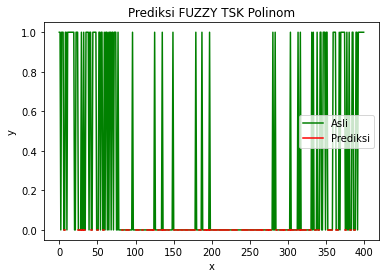

In [89]:
plt.plot(x1, y1,  label = "Asli",  color='green')
plt.plot(x1, y2, label = "Prediksi", color='red')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Prediksi FUZZY TSK Polinom')
plt.legend()
plt.show()